**Computational Models for Complex Systems Project - University of Pisa**

**Authors**: Giulia Ghisolfi

# Protein Synthesis Simulation

Load dataset:

In [1]:
from HumanGenomeDataset.load_dataset import load_dataset

data_df = load_dataset('dna_protein_coding_sequences')
data_df.head(2)

c:\Users\giuli\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


,ID,sequence,category
0,NM_001368254.1,GCTGAGCTGAGCTGGGGCGCAGCCGCCTGTCTGCACCGGCAGCACC...,NM
1,NM_001350977.1,TCCACAACTGAAACATCCACTTCTGAACACCATGTCCTACTACAGC...,NM


## Simulation

In [2]:
from src.simulation import ProteinSinthesisProcess

In [3]:
import random
RANDOM_SEED = 42
random.seed(RANDOM_SEED)

# Simulation parameters
SIM_TIME = 3600*12 # 12 hours
NUMBER_RESOURCES = 1e+6
NUMBER_RNA_POLYMERASES = 200
NUMBER_RIBOSOMES = 50
NUMBER_RNA_TRANSFER = 500
URACIL_INITIAL_AMOUNT = random.randint(8e+4, 1e+5)
ADENINE_INITIAL_AMOUNT = random.randint(8e+4, 1e+5)
GUANINE_INITIAL_AMOUNT = random.randint(8e+4, 1e+5)
CYTOSINE_INITIAL_AMOUNT = random.randint(8e+4, 1e+5)

In [4]:
protein_synthesis_process = ProteinSinthesisProcess(
    dna_sequences_df=data_df,
    number_resources=NUMBER_RESOURCES,
    number_rna_polymerases=NUMBER_RNA_POLYMERASES, 
    number_ribosomes=NUMBER_RIBOSOMES,
    number_rna_transfers_per_codon=NUMBER_RNA_TRANSFER,
    uracil_initial_amount=URACIL_INITIAL_AMOUNT,
    adenine_initial_amount=ADENINE_INITIAL_AMOUNT,
    guanine_initial_amount=GUANINE_INITIAL_AMOUNT,
    cytosine_initial_amount=CYTOSINE_INITIAL_AMOUNT,
    random_seed=RANDOM_SEED,
    verbose=True
    )

Simulation environment initialized, time unit: 0.0001 second.


In [5]:
print(protein_synthesis_process)

Protein Sinthesis Process:
185310 dna sequences to synthesize,
1000000.0 resources available,
200 RNA polymerases,
50 ribosomes,
83648 uracil bases,
80819 adenine bases,
89012 guanine bases,
88024 cytosine bases.


In [6]:
print(repr(protein_synthesis_process))

Protein Sinthesis Process:
185310 dna sequences to synthesize,
1000000.0 resources available,
200 RNA polymerases,
50 ribosomes,
83648 uracil bases,
80819 adenine bases,
89012 guanine bases,
88024 cytosine bases,
531 transfer RNA for UUU codon,
464 transfer RNA for UCU codon,
453 transfer RNA for UAU codon,
544 transfer RNA for UGU codon,
485 transfer RNA for UUC codon,
481 transfer RNA for UCC codon,
478 transfer RNA for UAC codon,
467 transfer RNA for UGC codon,
544 transfer RNA for UUA codon,
463 transfer RNA for UCA codon,
536 transfer RNA for UAA codon,
544 transfer RNA for UGA codon,
519 transfer RNA for UUG codon,
461 transfer RNA for UCG codon,
525 transfer RNA for UAG codon,
504 transfer RNA for UGG codon,
454 transfer RNA for CUU codon,
453 transfer RNA for CCU codon,
461 transfer RNA for CAU codon,
477 transfer RNA for CGU codon,
479 transfer RNA for CUC codon,
514 transfer RNA for CCC codon,
527 transfer RNA for CAC codon,
453 transfer RNA for CGC codon,
521 transfer RNA fo

In [7]:
protein_synthesis_process.run(simulation_time=SIM_TIME) # run the simulation

Simulation started
Time 0.0000: DNA Sequence 0 requesting to start synthesis
Time 0.0000: DNA Sequence 0 synthesize started
Time 0.0000: DNA Sequence 0 start transcription process
Time 0.0000: DNA Sequence 0 contains 6 promoters
Time 0.0000: DNA Sequence 0 (mRNA sequence 0) start transcription process
Time 1.1133: DNA Sequence 1 requesting to start synthesis
Time 1.1133: DNA Sequence 1 synthesize started
Time 1.1133: DNA Sequence 1 start transcription process
Time 1.1133: DNA Sequence 1 contains 4 promoters
Time 1.1133: DNA Sequence 1 (mRNA sequence 0) start transcription process
Time 1.6342: DNA Sequence 2 requesting to start synthesis
Time 1.6342: DNA Sequence 2 synthesize started
Time 1.6342: DNA Sequence 2 start transcription process
Time 1.6342: DNA Sequence 2 contains 0 promoters
Time 1.6342: DNA Sequence 2 synthetis ended
Time 7.9433: DNA Sequence 1 start translation process
Time 7.9433: DNA Sequence 1 (mRNA sequence 0) start translation process
Time 8.6731: DNA Sequence 3 reque

Start simulation:

In [8]:
TEST_NAME='12h_simulation'
protein_synthesis_process.save_process(folder_test_name=TEST_NAME) # save the process

Process saved.


## Results

In [9]:
import pandas as pd
TEST_NAME='12h_simulation'
results_path = 'results/'+TEST_NAME+'/results.csv'

results_df = pd.read_csv(results_path, index_col=0)

In [10]:
print('Number of DNA sequence traslated:', results_df[results_df['mrna_sequences'].notna()].shape[0])
print('Number of DNA sequence not traslated:', results_df[results_df['protein_synthesized']==False].shape[0])

Number of DNA sequence traslated: 8057
Number of DNA sequence not traslated: 568


In [11]:
results_df[results_df['mrna_sequences'].notna()][[
    'polypeptides_chains', 'number_of_proteins_synthesized', 'number_of_proteins_synthesized_per_mrna', 
    'length_proteins', 'number_different_proteins']].head()

,polypeptides_chains,number_of_proteins_synthesized,number_of_proteins_synthesized_per_mrna,length_proteins,number_different_proteins
13,"['NH2-RTLGS-COOH', 'NH2-NRSG-COOH']",10,"[2, 8]","[5, 4]",2.0
14,"['NH2-GSLCAFLSVTSFRNTYSRYTLS-COOH', None, 'NH2...",18,"[6, 6, 6]","[22, 3]",2.0
40,"[None, 'NH2-E-COOH', 'NH2-KFL-COOH', 'NH2-RKSM...",52,"[4, 7, 7, 6, 2, 8, 5, 2, 11]","[1, 3, 4, 5, 29, 2, 30]",7.0
65,"['NH2-SLLTKYSIYVVAYRSVLPYNRSEYFLPL-COOH', 'NH2...",14,"[4, 1, 2, 7]","[28, 3, 3, 20]",4.0
99,['NH2-FIRKDLFQTNKRE-COOH'],14,[14],[13],1.0


In [12]:
results_df[results_df['mrna_sequences'].notna()][
    ['request_start_process_time', 'start_process_time', 'end_process_time',
    'number_different_proteins', 'number_of_proteins_synthesized']
    ].describe()

,request_start_process_time,start_process_time,end_process_time,number_different_proteins,number_of_proteins_synthesized
count,8057.000000,8057.000000,8057.000000,8057.000000,8057.000000
mean,21647.828907,21647.828907,21947.588844,2.286583,14.878367
std,12457.319722,12457.319722,12452.281336,2.164914,16.588478
min,0.000000,0.000000,85.360700,0.000000,1.000000
25%,10866.735400,10866.735400,11193.324800,1.000000,5.000000
50%,21834.360100,21834.360100,22099.323900,2.000000,10.000000
75%,32379.649300,32379.649300,32702.220800,3.000000,20.000000
max,43137.781100,43137.781100,43199.166800,40.000000,277.000000


### Protein Length

In [13]:
from src.utils.plot_utils import *

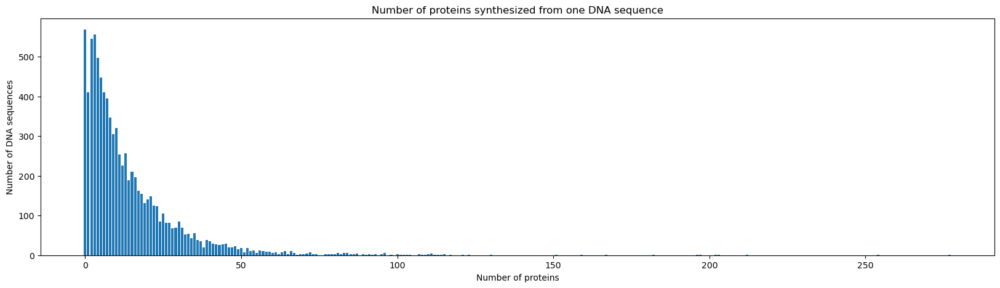

In [14]:
barplot_proteins_number(results_df)

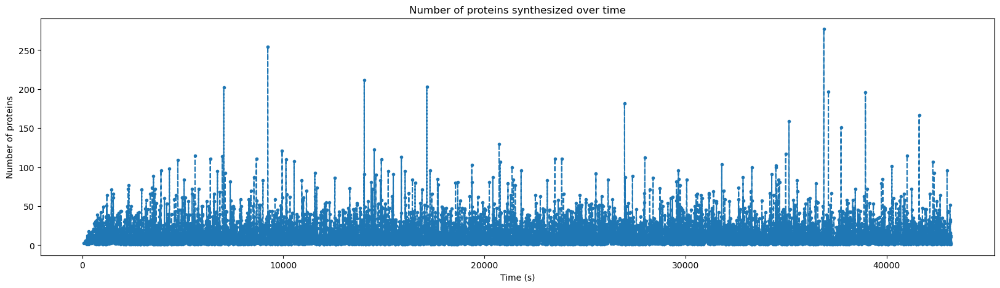

In [15]:
plot_proteins_number_over_time(results_df)

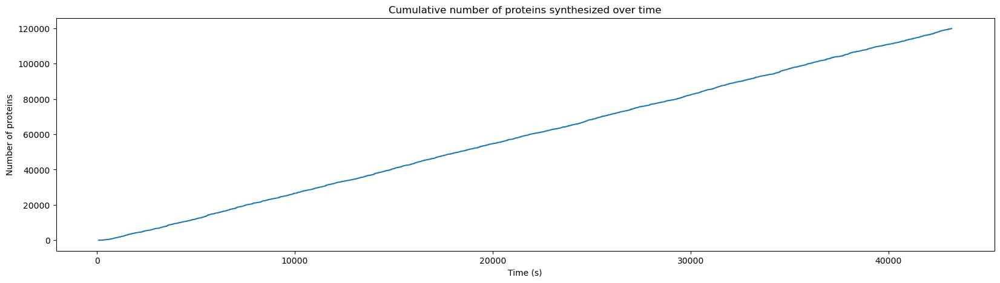

In [16]:
plot_cumulative_proteins_number_over_time(results_df)

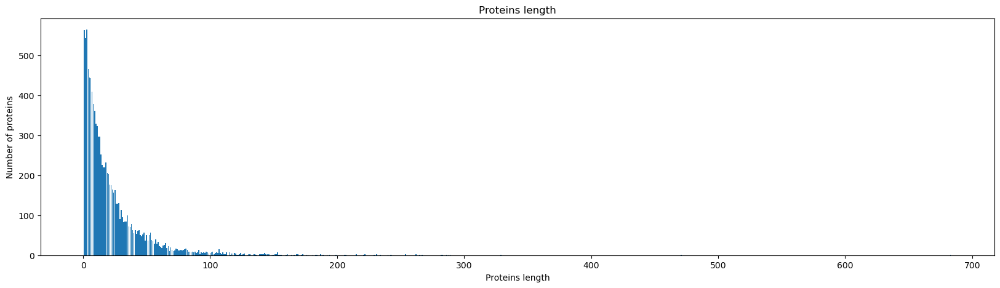

In [17]:
barplot_proteins_length(results_df)

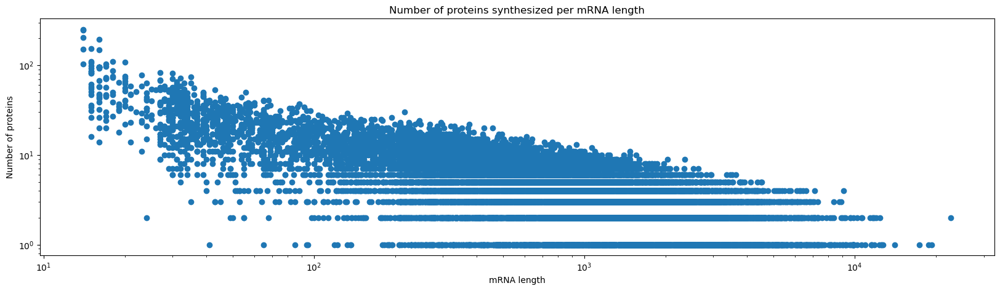

In [18]:
plot_number_proteins_per_length_mrna(results_df)

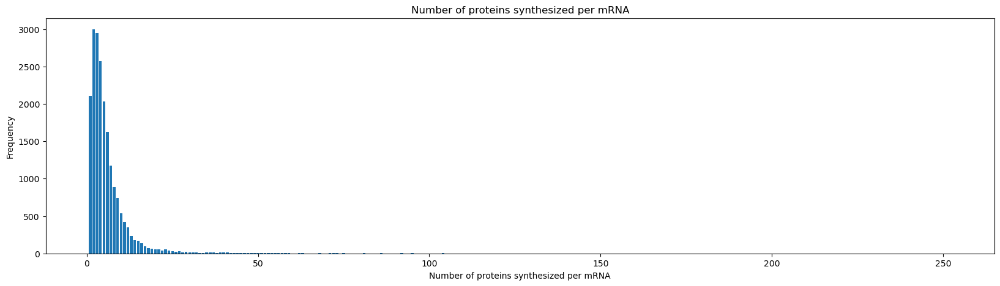

In [19]:
barplot_number_proteins_per_mrna(results_df)

### Process time

Whole process:

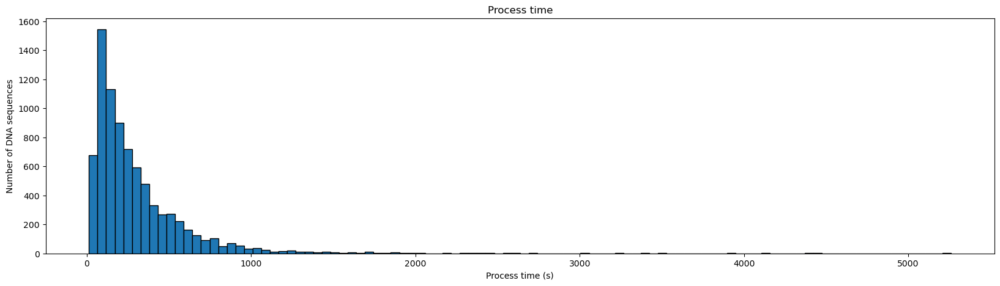

In [20]:
hist_process_time(results_df)

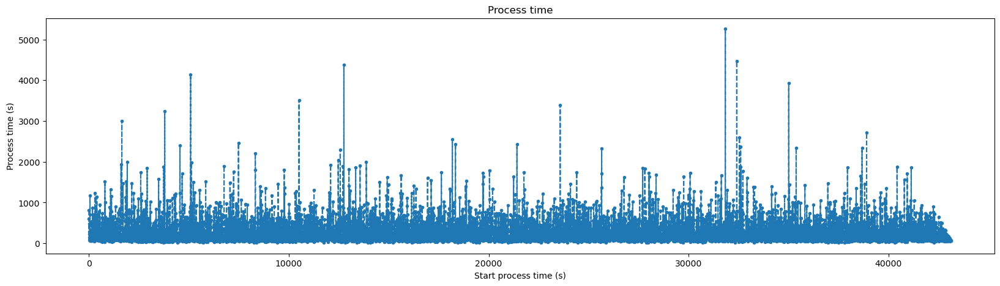

In [21]:
plot_process_time(results_df)

mRNA lifetime:

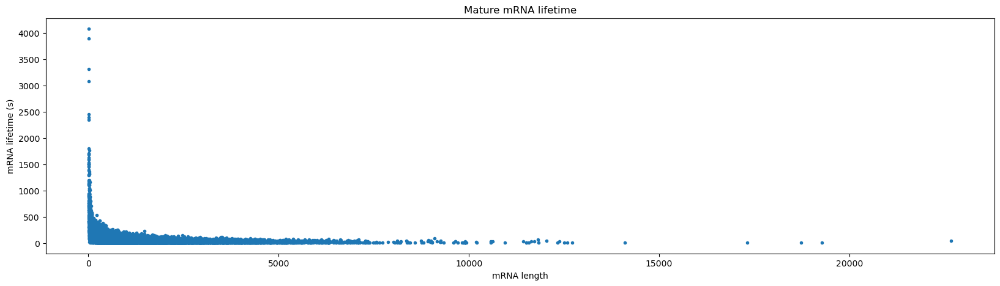

In [36]:
plot_mrna_lifetime(results_df)

### Nucleotides Level

In [24]:
import json

with open('results/'+TEST_NAME+'/nucleotides/nucleotides_history_uracil.json') as f:
    uracil_dict = json.load(f)

with open('results/'+TEST_NAME+'/nucleotides/nucleotides_history_adenine.json') as f:
    adenine_dict = json.load(f)

with open('results/'+TEST_NAME+'/nucleotides/nucleotides_history_guanine.json') as f:
    guanine_dict = json.load(f)

with open('results/'+TEST_NAME+'/nucleotides/nucleotides_history_cytosine.json') as f:
    cytosine_dict = json.load(f)

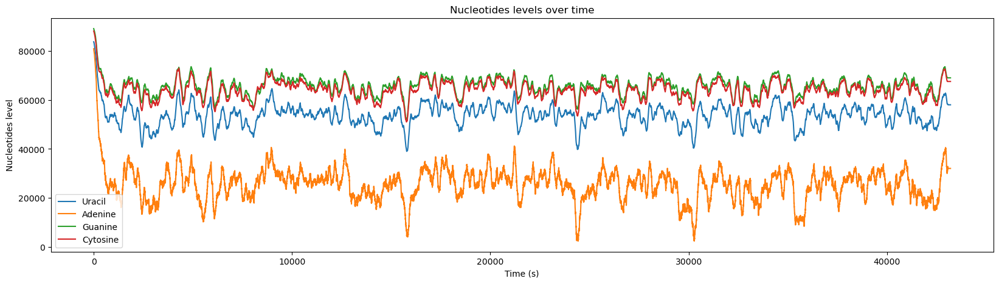

In [25]:
plot_nucleotide_level_over_time(uracil_dict, adenine_dict, guanine_dict, cytosine_dict, time_unit=1)

### RNA Polymerase

In [26]:
with open('results/'+TEST_NAME+'/rna_polymerase_history.json') as f:
    rna_polymerase_dict = json.load(f)

In [27]:
rna_polymerase_df = dict_to_dataframe(rna_polymerase_dict)

In [28]:
rna_polymerase_df.describe() # values in seconds

,queue,request_time,available_time,wait_time,end_time,usage_time
count,20065.0,20065.000000,20065.000000,20065.0,20065.000000,20065.000000
mean,0.0,21743.070066,21743.070066,0.0,21767.044619,1.922673
std,0.0,12397.585245,12397.585245,0.0,12397.394817,1.716081
min,0.0,0.000000,0.000000,0.0,7.943300,0.000100
25%,0.0,11052.999700,11052.999700,0.0,11070.905500,0.610300
50%,0.0,21937.116500,21937.116500,0.0,21963.844300,1.430000
75%,0.0,32400.810300,32400.810300,0.0,32430.519800,2.761500
max,0.0,43165.026900,43165.026900,0.0,43199.303200,13.052200


### Ribosome

In [29]:
with open('results/'+TEST_NAME+'/ribosome_history.json') as f:
    ribosome_dict = json.load(f)

In [30]:
ribosome_df = dict_to_dataframe(ribosome_dict)

In [31]:
ribosome_df.describe()

,queue,request_time,available_time,wait_time,end_time,usage_time
count,125669.000000,125669.000000,125669.000000,125669.000000,125669.000000,1.256690e+05
mean,0.022313,22138.065540,22138.070329,0.002022,22150.008046,3.426455e-01
std,0.281291,12381.496352,12381.497728,0.029366,12381.464506,3.460983e-01
min,0.000000,7.943300,7.943300,0.000000,19.522300,2.785328e-11
25%,0.000000,11453.815000,11453.815000,0.000000,11465.287900,9.910000e-02
50%,0.000000,22517.965500,22517.965500,0.000000,22530.649500,2.386000e-01
75%,0.000000,32872.918800,32872.918800,0.000000,32885.089800,4.725000e-01
max,11.000000,43187.176900,43187.176900,1.570400,43199.990500,1.148500e+01


Resources request wait time:

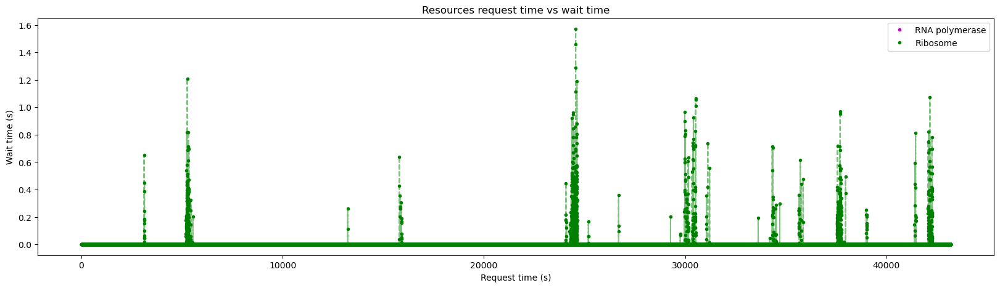

In [32]:
resources_request_wait_time(rna_polymerase_df, ribosome_df)

### Transfer RNA

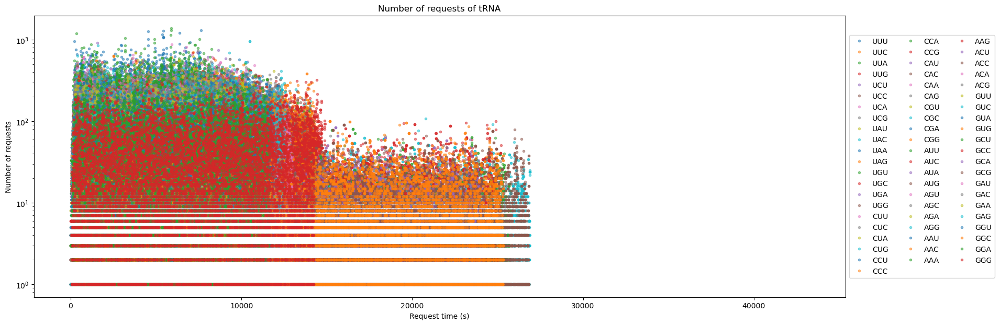

In [33]:
plot_codons_request(file_path='results/'+TEST_NAME+'/rna_transfer/', time_unit=1)

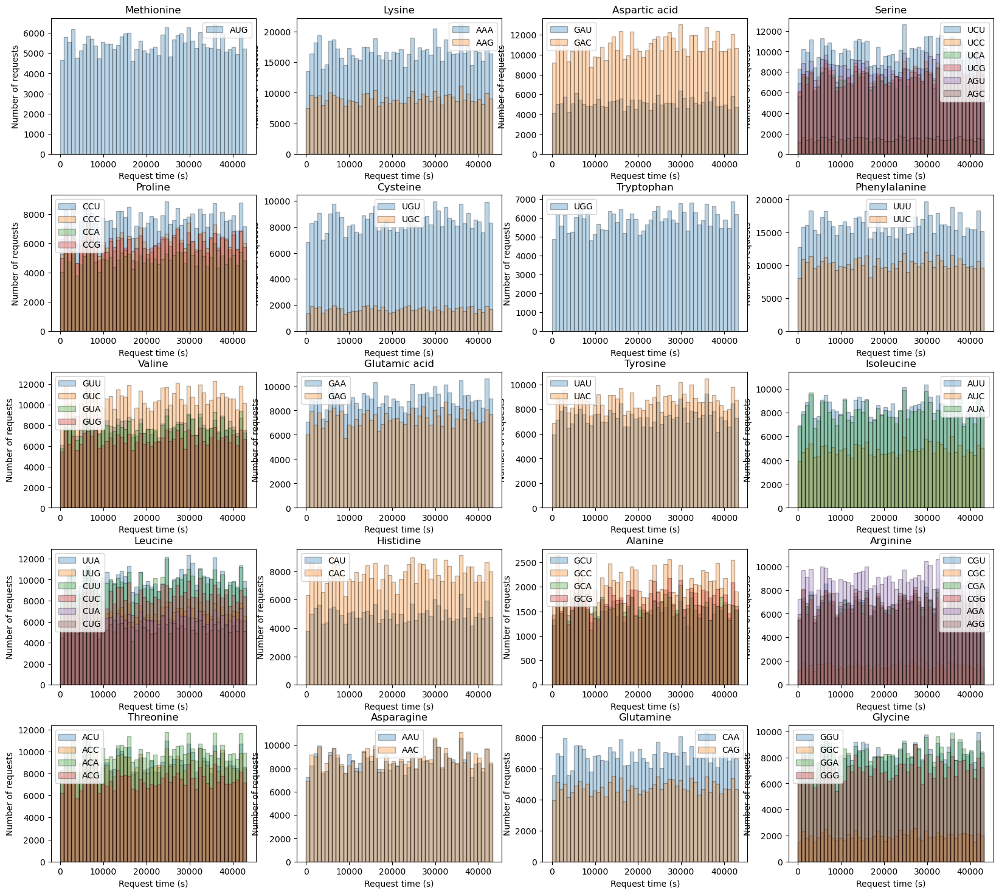

In [34]:
plot_codons_request_per_aminoacid(file_path='results/'+TEST_NAME+'/rna_transfer/', time_unit=1)